In [1]:
from utils import set_up_logging

set_up_logging()

import torch
from training import HistogramDataset
from visualisation import display_images
from models import load_model
from config import MODELS_PATH, TEST_DATA

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
model, hyperparameters = load_model(MODELS_PATH / "run_13", device)
dataset = HistogramDataset(
    TEST_DATA,
    edit_count=hyperparameters["edit_count"],
    bin_count=hyperparameters["bin_count"],
    target_size=(640, 640),
)

2024-06-28 07:33:48,353 - INFO - Loading model from /home/andras/projects/bipolaroid/saved_models/run_13
2024-06-28 07:33:48,354 - INFO - Hyperparameters: {'batch_size': 64, 'edit_count': 12, 'bin_count': 16, 'learning_rate': 0.00346006104230179, 'scheduler_gamma': 0.8696229263858167, 'num_epochs': 12, 'elu_alpha': 1.3186797055872976, 'leaky_relu_slope': 0.028723863794983127, 'dropout_prob': 0.0483439200772893, 'features': [16, 16, 16], 'use_residual': False, 'kernel_size': 3, 'model_type': 'HistogramNet', 'use_instance_norm': False, 'use_elu': True, 'leaky_relu_alpha': 0.03164975177595501}
2024-06-28 07:33:49,722 - INFO - Parameter count: 28641
2024-06-28 07:33:49,728 - INFO - Loaded 2498 original images


In [2]:
img_idx = 1008
img = dataset.get_original_image(img_idx)

edits = {"Original": img}
edits.update(
    {f"Edit {i}": dataset.get_edited_image(img_idx, edit_idx=i) for i in range(1, 36)}
)

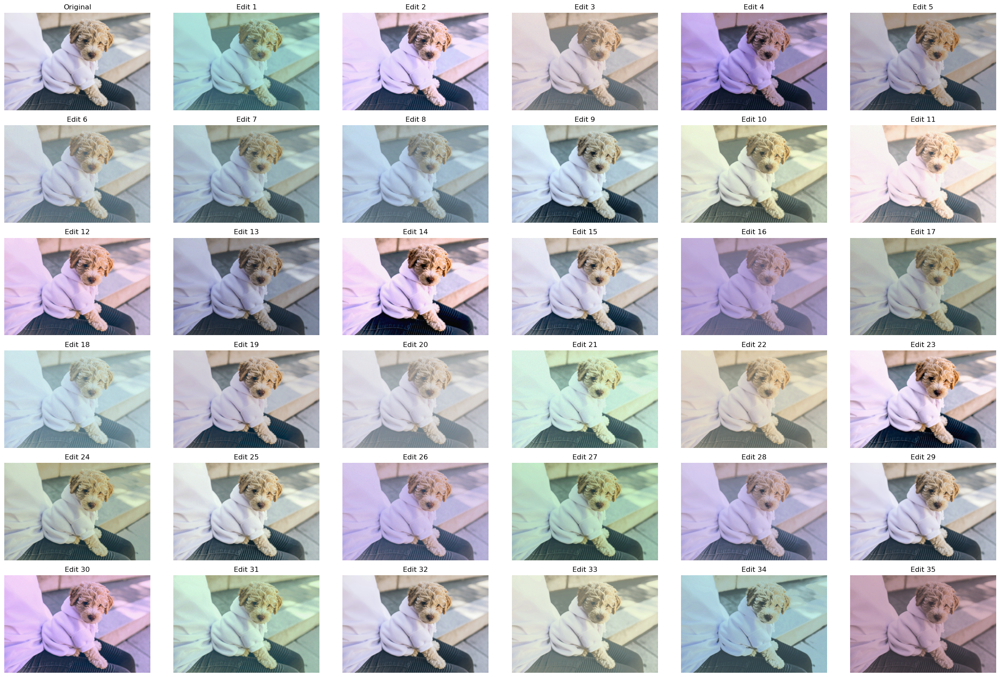

In [3]:
display_images(edits, images_per_row=6, figsize=(24, 16))

In [6]:
import numpy
from utils import compute_histogram

with torch.no_grad():
    inputs = (
        torch.tensor(
            numpy.array(
                [
                    compute_histogram(
                        image, bins=hyperparameters["bin_count"], normalize=True
                    )
                    for image in edits.values()
                ]
            ),
            dtype=torch.float,
        ).unsqueeze(1)
    ).to(device)

    outputs = model(inputs).to("cpu")

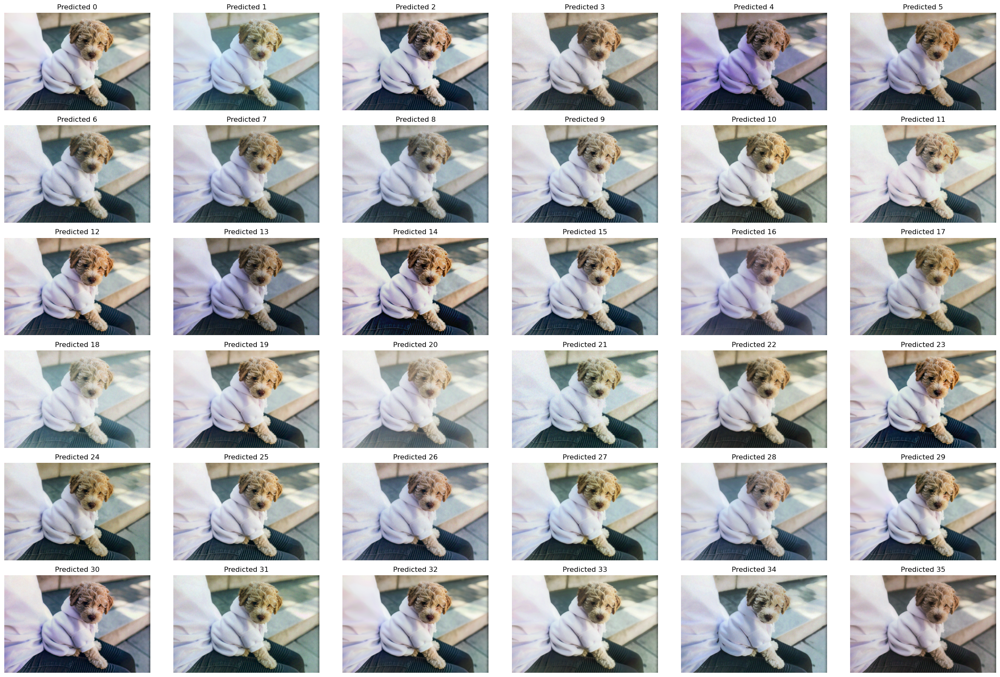

In [7]:
from histogram_transfer import apply_histogram
from PIL import Image
import concurrent.futures


with concurrent.futures.ProcessPoolExecutor() as executor:
    results = list(
        executor.map(
            apply_histogram,
            edits.values(),
            outputs,
            [hyperparameters["bin_count"] for _ in range(len(edits))],
        )
    )

predicted = {
    f"Predicted {i}": Image.fromarray(result) for i, result in enumerate(results)
}
display_images(predicted, images_per_row=6, figsize=(24, 16))